# Setup

In [1]:
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import numpy as np

def format_plt():
    """
    Formats matplotlib to appear use Latex + Seaborn theme.
    """
    global plt
    plt.rcParams.update(
        {
            "text.usetex": True,
            "font.family": "serif",
            "font.serif": ["Computer Modern Roman"],  # or another LaTeX font
            "axes.grid": False,
            "text.color": "black",
        }
    )
    plt.rcParams["figure.figsize"] = [5, 5]
    plt.style.use("seaborn-v0_8-bright")

format_plt()

# Normal Gamma Stable Langevin Example

In [2]:
from stonesoup.types.groundtruth import GroundTruthPath, GroundTruthState
from mystonesoup.drivers import NormalGammaDriver
from mystonesoup.base import CombinedLinearNonGaussianTransitionExtModel
from mystonesoup.models import Langevin
from datetime import datetime, timedelta

# And the clock starts
start_time = datetime.now().replace(microsecond=0)
seed = 4

mu_W = 0.
sigma_W = 1.
c = 10
gamma = np.sqrt(2.)
beta = (gamma ** 2) / 2.
nu = 2
noise_case = 2
theta = -0.1

ts_driver_x = NormalGammaDriver(c=c, nu=nu, beta=beta, mu_W=mu_W, sigma_W=sigma_W, noise_case=noise_case, seed=seed)
langevin_x = Langevin(theta=theta, ng_driver=ts_driver_x)
ts_driver_x.register_model(langevin_x)

langevin_y = Langevin(theta=theta, ng_driver=ts_driver_x)
ts_driver_x.register_model(langevin_y)
transition_model = CombinedLinearNonGaussianTransitionExtModel([langevin_x, langevin_y])

timesteps = [start_time]
truth = GroundTruthPath([GroundTruthState([0, 1, 0, 1], timestamp=timesteps[0])])

num_steps = 100
for k in range(1, num_steps + 1):
    timesteps.append(start_time+timedelta(seconds=k))  # add next timestep to list of timesteps
    truth.append(GroundTruthState(
        transition_model.function(truth[k-1], noise=True, time_interval=timedelta(seconds=1)),
        timestamp=timesteps[k]))


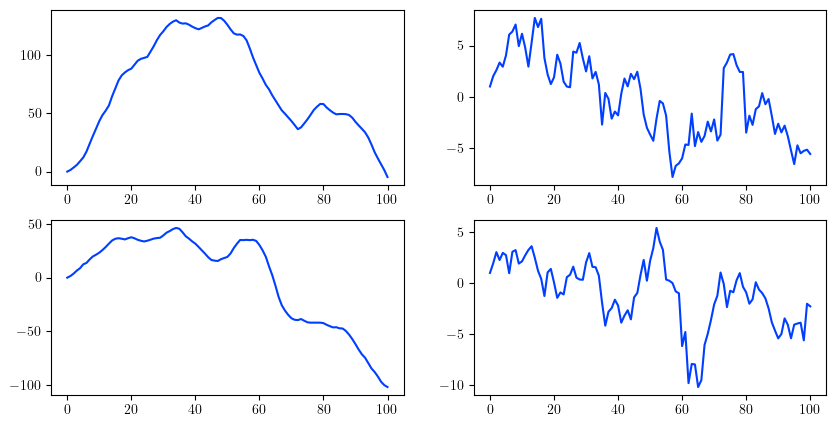

In [3]:
t = np.array([(data.timestamp - start_time).total_seconds() for data in truth])
t -= t[0]

y0 = np.array([data.state_vector[0] for data in truth])
y1 = np.array([data.state_vector[1] for data in truth])
y2 = np.array([data.state_vector[2] for data in truth])
y3 = np.array([data.state_vector[3] for data in truth])

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

axs[0][0].plot(t, y0)
axs[0][1].plot(t, y1)
axs[1][0].plot(t, y2)
axs[1][1].plot(t, y3)


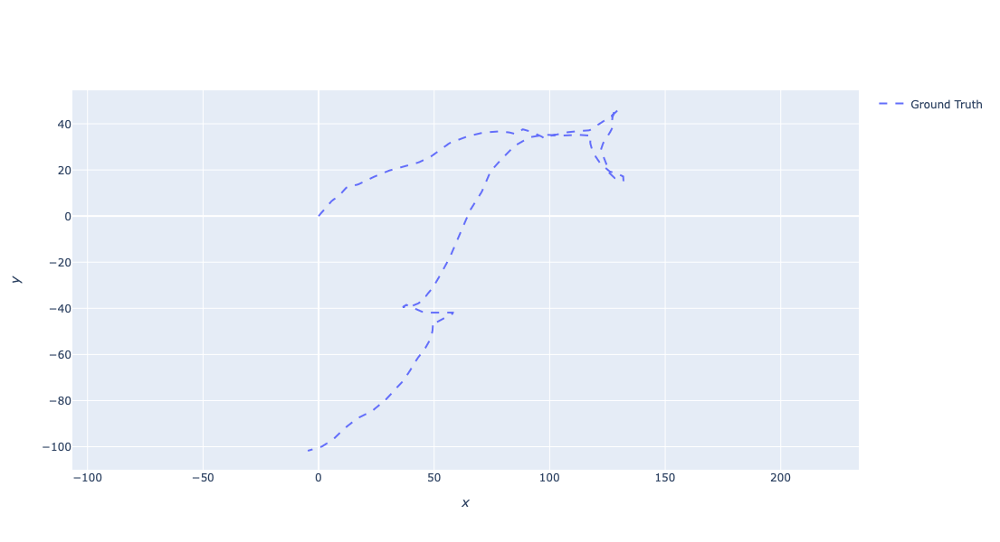

In [4]:
from stonesoup.plotter import Plotterly

plotter_static = Plotterly(autosize=False,
    width=600,
    height=600,)
plotter_static.plot_ground_truths(truth, [0, 2])
plotter_static.fig

# Testing using migration dataset

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import numpy as np

# Read CSV file into a pandas DataFrame
df = pd.read_csv("dataset/migration_original.csv")
tags = df["tag-local-identifier"].unique()

In [8]:
from mystonesoup.drivers import AlphaStableDriver
from mystonesoup.base import CombinedLinearNonGaussianTransitionExtModel
from mystonesoup.models import Langevin

seed = 4

mu_W = 0.
sigma_W = 0.2
c = 10
alpha = 1.4
noise_case = 2
theta = -0.1

as_driver_x = AlphaStableDriver(c=c, alpha=alpha, mu_W=mu_W, sigma_W=sigma_W, noise_case=noise_case, seed=seed)
langevin_x = Langevin(theta=theta, ng_driver=as_driver_x)
as_driver_x.register_model(langevin_x)

langevin_y = Langevin(theta=theta, ng_driver=as_driver_x)
as_driver_x.register_model(langevin_y)
transition_model = CombinedLinearNonGaussianTransitionExtModel([langevin_x, langevin_y])

In [38]:
def get_data(df, tag, truncate=0.):
    # Extract longitude and latitude columns
    mask = df["tag-local-identifier"] == tag
    df = df[mask]
    length = len(df)
    stop = int((1. - truncate) * length)
    df = df.iloc[0:stop]
    long = df["location-long"]
    lat = df["location-lat"]
    unix_ts = pd.to_datetime(df['timestamp']).astype(int) // 10**9
    timestamps = [datetime.datetime.fromtimestamp(uts) for uts in unix_ts]
    return timestamps, lat, long

In [39]:
timestamps, lat, long = get_data(df, tags[0], truncate=0.5)
coords = list(zip(lat, long))


In [40]:
print(np.diff(timestamps))

[datetime.timedelta(seconds=21600) datetime.timedelta(seconds=32400)
 datetime.timedelta(seconds=10800) datetime.timedelta(seconds=21600)
 datetime.timedelta(seconds=21600) datetime.timedelta(seconds=32400)
 datetime.timedelta(seconds=10800) datetime.timedelta(seconds=21600)
 datetime.timedelta(seconds=21600) datetime.timedelta(seconds=32400)
 datetime.timedelta(seconds=10800)
 datetime.timedelta(days=1, seconds=21600)
 datetime.timedelta(seconds=21600) datetime.timedelta(seconds=32400)
 datetime.timedelta(days=1) datetime.timedelta(seconds=32400)
 datetime.timedelta(seconds=21600) datetime.timedelta(seconds=32400)
 datetime.timedelta(seconds=10800) datetime.timedelta(seconds=21600)
 datetime.timedelta(seconds=21600) datetime.timedelta(seconds=32400)
 datetime.timedelta(seconds=10800) datetime.timedelta(seconds=21600)
 datetime.timedelta(seconds=21600) datetime.timedelta(seconds=32400)
 datetime.timedelta(seconds=10800) datetime.timedelta(seconds=21600)
 datetime.timedelta(seconds=2160

In [11]:
from stonesoup.types.detection import Detection
from stonesoup.models.measurement.linear import LinearGaussian
import datetime

start_time = timestamps[0]

measurement_model = LinearGaussian(
    ndim_state=4,  # Number of state dimensions (position and velocity in 2D)
    mapping=(0, 2),  # Mapping measurement vector index to state index
    noise_covar=np.array([[1, 0],  # Covariance matrix for Gaussian PDF
                          [0, 1]])
    )

measurements = []
for timestamp, coord in zip(timestamps, coords):
    measurements.append(Detection(coord,
                                  timestamp=timestamp,
                                  measurement_model=measurement_model))

In [12]:
from mystonesoup.filters import RBParticlePredictor
predictor = RBParticlePredictor(transition_model=transition_model)

from stonesoup.resampler.particle import SystematicResampler
resampler = SystematicResampler()

from mystonesoup.filters import RBParticleUpdater
updater = RBParticleUpdater(measurement_model, resampler)

from scipy.stats import multivariate_normal
from stonesoup.types.numeric import Probability  # Similar to a float type
from mystonesoup.filters import RBParticleState
from stonesoup.types.array import StateVectors

number_particles = 50

# Sample from the prior Gaussian distribution
states = multivariate_normal.rvs(np.array([coords[0][0], 1, coords[0][1], 1]),
                                  np.diag([0., 0., 0., 0.]),
                                  size=number_particles)
covars = np.stack([np.eye(4) for i in range(number_particles)], axis=2)

# Create prior particle state.
prior = RBParticleState(
    state_vector=StateVectors(states.T),
    covariance=covars,
    weight=np.array([Probability(1/number_particles)]*number_particles),
                      timestamp=start_time)


In [13]:
from stonesoup.types.hypothesis import SingleHypothesis
from stonesoup.types.track import Track

track = Track()
for measurement in measurements:
    prediction = predictor.predict(prior, timestamp=measurement.timestamp)
    hypothesis = SingleHypothesis(prediction, measurement)
    post = updater.update(hypothesis)
    track.append(post)
    prior = track[-1]

In [41]:
from stonesoup.plotter import AnimatedPlotterly

plotter = AnimatedPlotterly(timestamps[::3], tail_length=0.3, width=600, height=600)
plotter.plot_measurements(measurements, [0, 2])
plotter.plot_tracks(track, [0, 2], particle=True, plot_history=False, uncertainty=True)

fig = plotter.fig
fig

ValueError: Ensure timesteps are equally spaced.

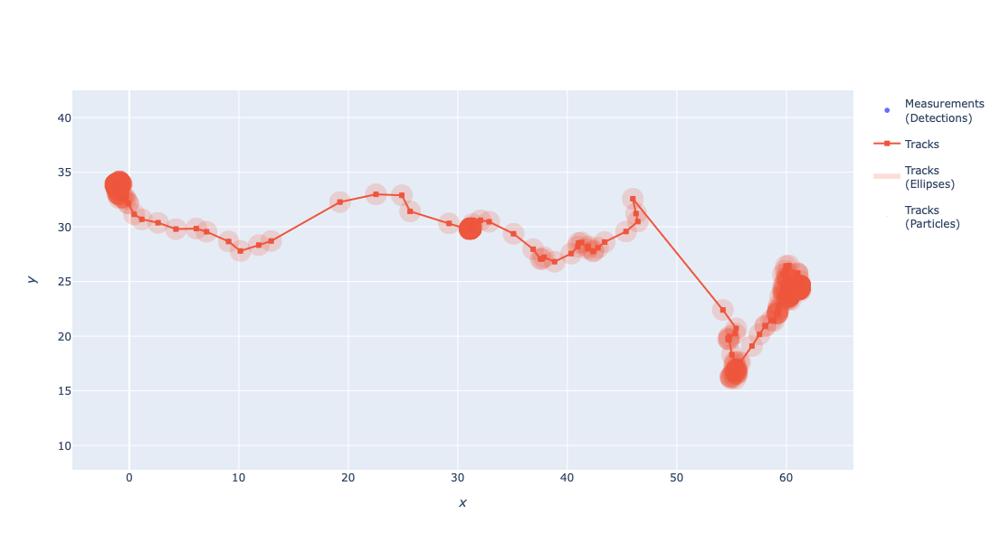

In [17]:
# from mystonesoup.plotter import MyPlotterly
from stonesoup.plotter import Plotterly

plotter_static = Plotterly(autosize=False,
    width=600,
    height=600,)
plotter_static.plot_measurements(measurements, [0, 2])
plotter_static.plot_tracks(track, [0, 2], particle=True, uncertainty=True)
plotter_static.fig